<a href="https://colab.research.google.com/github/MatteoZancanaro-5758278/M_Zancanaro-Programming-BigDataAnalytics/blob/main/3_01_Statistical_Exploratory_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

In [4]:
from google.colab import files
upload = files.upload()

Saving spotify.csv to spotify.csv


In [5]:
spoti_data = pd.read_csv("spotify.csv")

spoti_data.head()

,user_id,age,country,subscription_type,listening_time,songs_played_per_day,skip_rate,device_type,ads_listened_per_week,offline_listening,is_churned
0,1,54,CA,Free,26,23,0.20,Desktop,31,0,1
1,2,33,DE,Family,141,62,0.34,Web,0,1,0
2,3,38,AU,Premium,199,38,0.04,Mobile,0,1,1
3,4,22,CA,Student,36,2,0.31,Mobile,0,1,0
4,5,29,US,Family,250,57,0.36,Mobile,0,1,1


In [4]:
#Missing value
spoti_data.isnull().sum()

,0
user_id,0
age,0
country,0
subscription_type,0
listening_time,0
songs_played_per_day,0
skip_rate,0
device_type,0
ads_listened_per_week,0
offline_listening,0


In [5]:
spoti_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                8000 non-null   int64  
 1   age                    8000 non-null   int64  
 2   country                8000 non-null   object 
 3   subscription_type      8000 non-null   object 
 4   listening_time         8000 non-null   int64  
 5   songs_played_per_day   8000 non-null   int64  
 6   skip_rate              8000 non-null   float64
 7   device_type            8000 non-null   object 
 8   ads_listened_per_week  8000 non-null   int64  
 9   offline_listening      8000 non-null   int64  
 10  is_churned             8000 non-null   int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 687.6+ KB


In [7]:
from google.colab import data_table

data_table.enable_dataframe_formatter() #to visualize all the table and scroll inside it

spoti_data

,user_id,age,country,subscription_type,listening_time,songs_played_per_day,skip_rate,device_type,ads_listened_per_week,offline_listening,is_churned
0,1,54,CA,Free,26,23,0.20,Desktop,31,0,1
1,2,33,DE,Family,141,62,0.34,Web,0,1,0
2,3,38,AU,Premium,199,38,0.04,Mobile,0,1,1
3,4,22,CA,Student,36,2,0.31,Mobile,0,1,0
4,5,29,US,Family,250,57,0.36,Mobile,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
7995,7996,44,DE,Student,237,36,0.30,Mobile,0,1,1
7996,7997,34,AU,Premium,61,64,0.59,Mobile,0,1,0
7997,7998,17,US,Free,81,62,0.33,Desktop,5,0,0
7998,7999,34,IN,Student,245,94,0.27,Desktop,0,1,0


# **Univariate Analysis** --- numerical data
Measures of central tendency, dispertion and ditribution/shape


In [10]:
selected_columns = ['listening_time', 'songs_played_per_day', 'skip_rate', 'ads_listened_per_week', 'age']

for col in selected_columns:
    print(f"\n--- {col} ---")
    print(f"Mean: {spoti_data[col].mean():.2f}")
    print(f"Median: {spoti_data[col].median():.2f}")
    print(f"Mode: {spoti_data[col].mode().values[0]:.2f}")
    print(f"Standard Deviation: {spoti_data[col].std():.2f}")
    print("Quantiles:")
    print(spoti_data[col].quantile([0.25, 0.5, 0.75]))
    Q1 = spoti_data[col].quantile(0.25)
    Q3 = spoti_data[col].quantile(0.75)
    IQR = Q3 - Q1
    print(f"IQR: {IQR:.2f}")

#or you can do it like that but less measures in describe()

  #print(spoti_data[col].describe())



--- listening_time ---
Mean: 154.07
Median: 154.00
Mode: 99.00
Standard Deviation: 84.02
Quantiles:
0.25     81.0
0.50    154.0
0.75    227.0
Name: listening_time, dtype: float64
IQR: 146.00

--- songs_played_per_day ---
Mean: 50.13
Median: 50.00
Mode: 39.00
Standard Deviation: 28.45
Quantiles:
0.25    25.0
0.50    50.0
0.75    75.0
Name: songs_played_per_day, dtype: float64
IQR: 50.00

--- skip_rate ---
Mean: 0.30
Median: 0.30
Mode: 0.34
Standard Deviation: 0.17
Quantiles:
0.25    0.15
0.50    0.30
0.75    0.45
Name: skip_rate, dtype: float64
IQR: 0.30

--- ads_listened_per_week ---
Mean: 6.94
Median: 0.00
Mode: 0.00
Standard Deviation: 13.62
Quantiles:
0.25    0.0
0.50    0.0
0.75    5.0
Name: ads_listened_per_week, dtype: float64
IQR: 5.00

--- age ---
Mean: 37.66
Median: 38.00
Mode: 51.00
Standard Deviation: 12.74
Quantiles:
0.25    26.0
0.50    38.0
0.75    49.0
Name: age, dtype: float64
IQR: 23.00


#### **Observations**



*   Listening_time: Mean is basically equal to the median, suggesting no skewness and no outliers. The standard deviation is more than half the mean, suggesting a fairly wide variation of listening behavior among users. Same is displayed by the IQR with a spread of 146, from 81 to 227 minutes.

*   songs_played_per_day: Mean is basically equal to the median, suggesting no skewness and no outliers. The standard deviation is more than half the mean, suggesting a fairly wide variation of songs played per day that reflects the listening time among users. Same is displayed by the IQR

* skip_rate: Mean is equal to the median, suggesting no skewness and no outliers. The standard deviation is moderate(is more than the mean but since is a percentage the scale is limited), most users have skip rates between 13% and 47%.

* ads_listened_per_week: median and mode equal to 0, meaning that half of the users heard no ads in a week. The mean is much greater then the mean suggesting a right skewed distribution, confirmed by the high SD of 13,62. The IQR is 5.0 so even those between 25-75 % are not really exposed to many ads

* age: Mean is basically equal to the median, suggesting no skewness and no outliers. The standard deviation is fairly low and this is confirmed by the IQR of 23.00, with half of the distribution between age 26 and 49.



In [12]:
for col in selected_columns:
  print(f"\n --- {col} ---")
  print(f"Skewness Income: {round(spoti_data[col].skew(),2)}")
  print(f"Kurtosis Income: {round(spoti_data[col].kurt(),2)}")


 --- listening_time ---
Skewness Income: 0.01
Kurtosis Income: -1.21

 --- songs_played_per_day ---
Skewness Income: -0.0
Kurtosis Income: -1.19

 --- skip_rate ---
Skewness Income: 0.01
Kurtosis Income: -1.19

 --- ads_listened_per_week ---
Skewness Income: 1.8
Kurtosis Income: 1.81

 --- age ---
Skewness Income: -0.03
Kurtosis Income: -1.21


#### **Observations**

(Rules of thumb skew)

skew < 0.5 → fairly symmetric

 0.5 ≤ skew < 1 → moderate skew

 skew ≥ 1 → highly skewed


(Rules of thumb kurt)

kurtosis| < 1 → fairly normal / flat

1–2 → moderately peaked or flat

2 → very heavy tails / sharp peak

The features have a moderate and very low skewness, a part from ads listened that has as expected a right skewness derived by the huge gap between mean and median. Kurtosis is mostly flat(songs played daily, skip rate, age, listening time), less likely to have outliers because of fewer data points located in the tails. On the other hand ads listened is showing once again a high curtosis, with more probability of high concentration of data far from the mean.

## Visualizing Distributions

### Histograms and Box plots


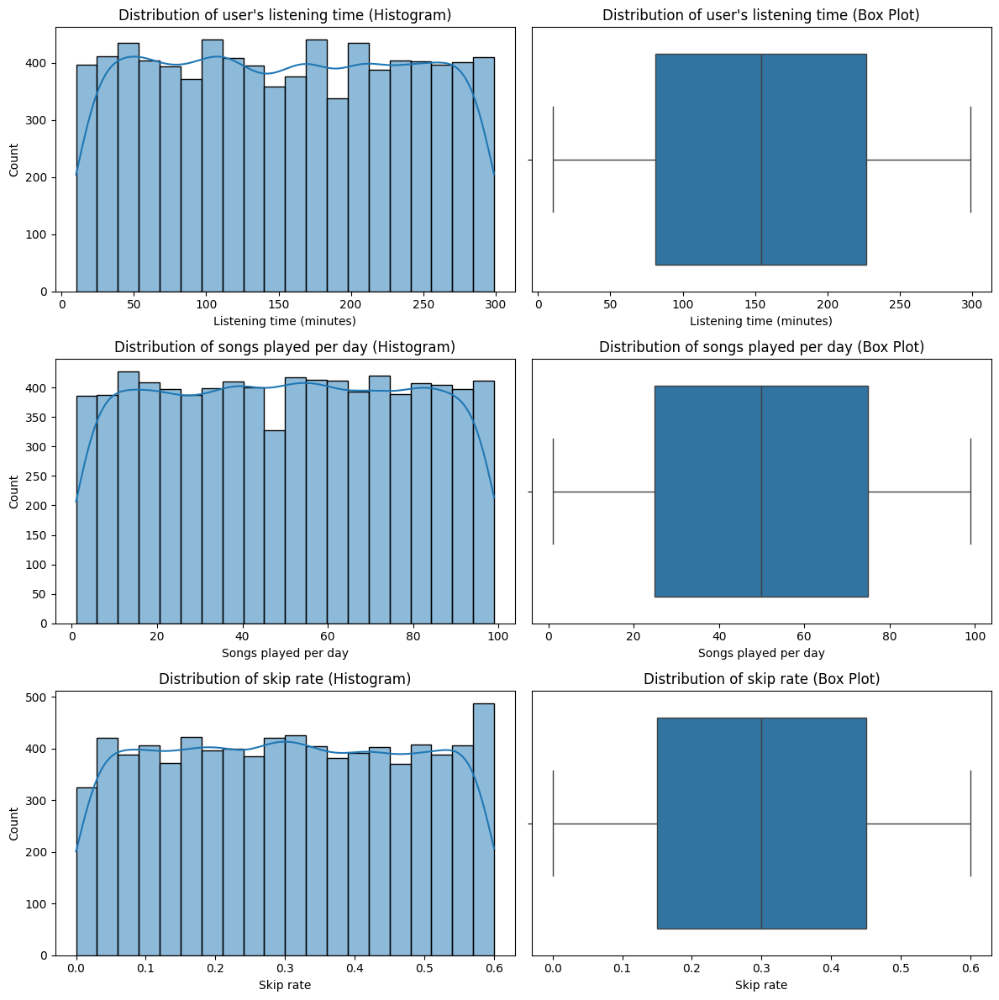

In [14]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12))

# Listening time plots
sns.histplot(spoti_data["listening_time"].dropna(), kde=True, ax=axes[0, 0])
axes[0, 0].set_title("Distribution of user's listening time (Histogram)")
axes[0, 0].set_xlabel("Listening time (minutes)")
sns.boxplot(x=spoti_data["listening_time"].dropna(), ax=axes[0, 1])
axes[0, 1].set_title("Distribution of user's listening time (Box Plot)")
axes[0, 1].set_xlabel("Listening time (minutes)")

# Songs played per day plots
sns.histplot(spoti_data["songs_played_per_day"].dropna(), kde=True, ax=axes[1, 0])
axes[1, 0].set_title("Distribution of songs played per day (Histogram)")
axes[1, 0].set_xlabel("Songs played per day")
sns.boxplot(x=spoti_data["songs_played_per_day"].dropna(), ax=axes[1, 1])
axes[1, 1].set_title("Distribution of songs played per day (Box Plot)")
axes[1, 1].set_xlabel("Songs played per day")

# Skip rate plots
sns.histplot(spoti_data["skip_rate"].dropna(), kde=True, ax=axes[2, 0])
axes[2, 0].set_title("Distribution of skip rate (Histogram)")
axes[2, 0].set_xlabel("Skip rate")
sns.boxplot(x=spoti_data["skip_rate"].dropna(), ax=axes[2, 1])
axes[2, 1].set_title("Distribution of skip rate (Box Plot)")
axes[2, 1].set_xlabel("Skip rate")

plt.tight_layout()
plt.show()

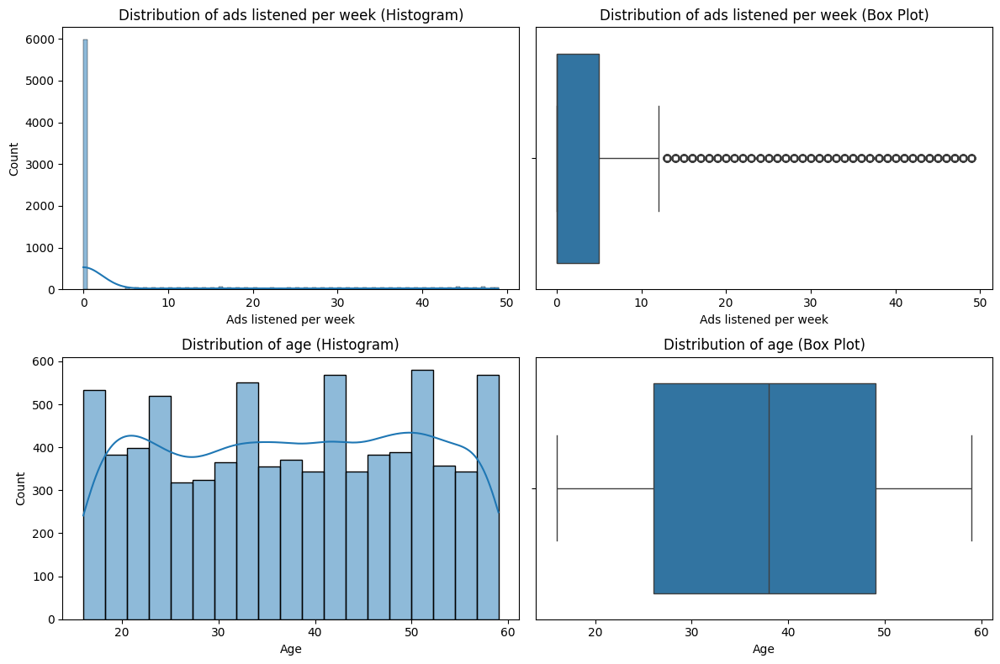

In [5]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Ads listened per week plots
sns.histplot(spoti_data["ads_listened_per_week"].dropna(), kde=True, ax=axes[0, 0])
axes[0, 0].set_title("Distribution of ads listened per week (Histogram)")
axes[0, 0].set_xlabel("Ads listened per week")
sns.boxplot(x=spoti_data["ads_listened_per_week"].dropna(), ax=axes[0, 1])
axes[0, 1].set_title("Distribution of ads listened per week (Box Plot)")
axes[0, 1].set_xlabel("Ads listened per week")

# Age plots
sns.histplot(spoti_data["age"].dropna(), kde=True, ax=axes[1, 0])
axes[1, 0].set_title("Distribution of age (Histogram)")
axes[1, 0].set_xlabel("Age")
sns.boxplot(x=spoti_data["age"].dropna(), ax=axes[1, 1])
axes[1, 1].set_title("Distribution of age (Box Plot)")
axes[1, 1].set_xlabel("Age")

plt.tight_layout()
plt.show()

#### **Observations**

Every feature is fairly uniform and symmetric with no strong skewness or outliers. On the other hand ads_listened_per_week is highly right skewed with majority of users experiencing no ads, there are a lot of outliers

# **Univariate Analysis** --- categorical data

country, subscription_type, device_type, offline_listening, is_churned

In [7]:
print("Country value counts")
print(spoti_data["country"].value_counts())
print("\nCountry Percentages")
print(spoti_data["country"].value_counts(normalize=True).mul(100).round(2))

print("\nSubscription type value counts")
print(spoti_data["subscription_type"].value_counts())
print("\nSubscription type Percentages")
print(spoti_data["subscription_type"].value_counts(normalize=True).mul(100).round(2))

print("\nDevice type value counts")
print(spoti_data["device_type"].value_counts())
print("\nDevice type Percentages")
print(spoti_data["device_type"].value_counts(normalize=True).mul(100).round(2))

print("\nOffline_listening value counts")
print(spoti_data["offline_listening"].value_counts())
print("\nOffline Listening Percentages")
print(spoti_data["offline_listening"].value_counts(normalize=True).mul(100).round(2))

print("\nIs churned value counts")
print(spoti_data["is_churned"].value_counts())
print("\nIs churned Percentages")
print(spoti_data["is_churned"].value_counts(normalize=True).mul(100).round(2))



Country value counts
country
AU    1034
US    1032
DE    1015
IN    1011
PK     999
FR     989
UK     966
CA     954
Name: count, dtype: int64

Country Percentages
country
AU    12.92
US    12.90
DE    12.69
IN    12.64
PK    12.49
FR    12.36
UK    12.08
CA    11.92
Name: proportion, dtype: float64

Subscription type value counts
subscription_type
Premium    2115
Free       2018
Student    1959
Family     1908
Name: count, dtype: int64

Subscription type Percentages
subscription_type
Premium    26.44
Free       25.22
Student    24.49
Family     23.85
Name: proportion, dtype: float64

Device type value counts
device_type
Desktop    2778
Web        2623
Mobile     2599
Name: count, dtype: int64

Device type Percentages
device_type
Desktop    34.72
Web        32.79
Mobile     32.49
Name: proportion, dtype: float64

Offline_listening value counts
offline_listening
1    5982
0    2018
Name: count, dtype: int64

Offline Listening Percentages
offline_listening
1    74.78
0    25.22
Name: pro

/tmp/ipython-input-710531866.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=spoti_data, x="country", ax=axes[0,0], palette="viridis")
/tmp/ipython-input-710531866.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=spoti_data, x="subscription_type", ax=axes[0,1], palette="viridis")
/tmp/ipython-input-710531866.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=spoti_data, x="device_type", ax=axes[1,0], palette="viridis")
/tmp/ipython-input-710531866.py:18: FutureWarning: 

Passing `palette` without assigning `hue`

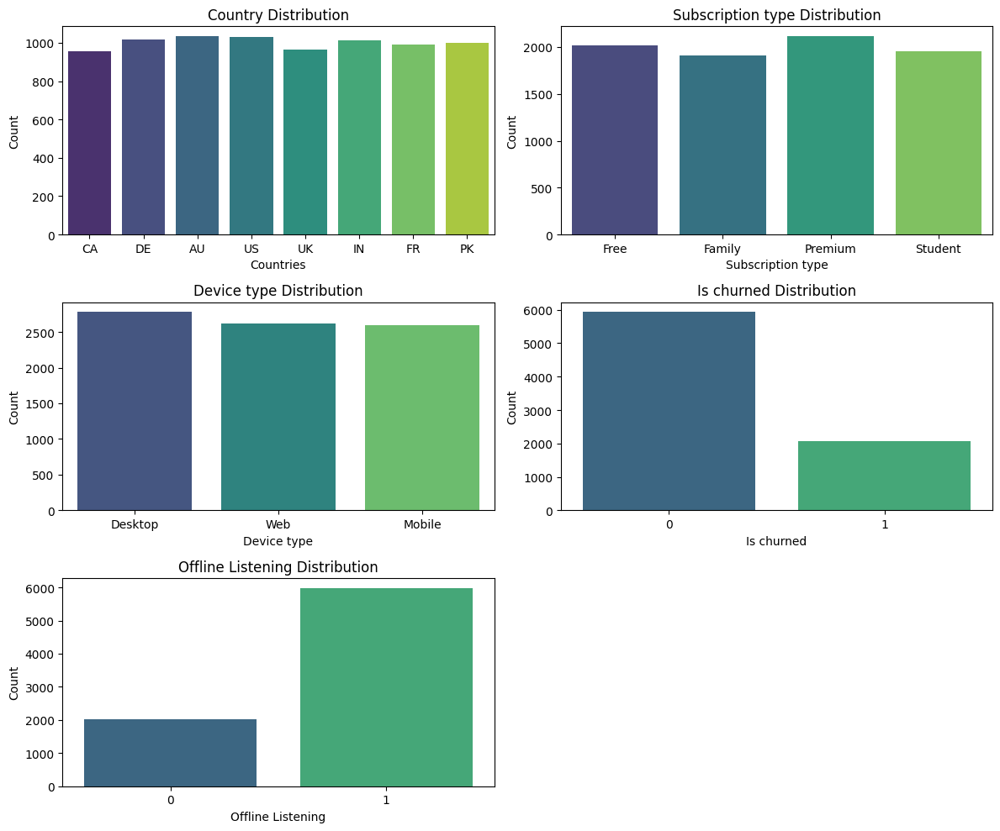

In [6]:
fig, axes = plt.subplots(3, 2, figsize=(12,10))

sns.countplot(data=spoti_data, x="country", ax=axes[0,0], palette="viridis")
axes[0,0].set_title("Country Distribution")
axes[0,0].set_xlabel("Countries")
axes[0,0].set_ylabel("Count")

sns.countplot(data=spoti_data, x="subscription_type", ax=axes[0,1], palette="viridis")
axes[0,1].set_title("Subscription type Distribution")
axes[0,1].set_xlabel("Subscription type")
axes[0,1].set_ylabel("Count")

sns.countplot(data=spoti_data, x="device_type", ax=axes[1,0], palette="viridis")
axes[1,0].set_title("Device type Distribution")
axes[1,0].set_xlabel("Device type")
axes[1,0].set_ylabel("Count")

sns.countplot(data=spoti_data, x="is_churned", ax=axes[1,1], palette="viridis")
axes[1,1].set_title("Is churned Distribution")
axes[1,1].set_xlabel("Is churned")
axes[1,1].set_ylabel("Count")

sns.countplot(data=spoti_data, x="offline_listening", ax=axes[2,0], palette="viridis")
axes[2,0].set_title("Offline Listening Distribution")
axes[2,0].set_xlabel("Offline Listening")
axes[2,0].set_ylabel("Count")


axes[2,1].set_visible(False)

#oppure per eliminarlo
# fig.delaxes(axes[2,1])
plt.tight_layout()
plt.show()



## Bivariate Analysis
Now we move from understanding individual variables (bi-variate) to seeing how they interact. This is where we start to uncover potential drivers or correlations.

### Numerical vs. Numerical


* **Pearson Correlation Coefficient ($r$):** Measures the strength and direction of a *linear* relationship between two numerical variables. Ranges from -1 (perfect negative linear) to +1 (perfect positive linear), with 0 indicating no linear relationship.
* **Spearman Rank Correlation Coefficient ($\rho$):** Measures the strength and direction of a *monotonic* relationship (not necessarily linear). Less sensitive to outliers and works for ordinal data.

**Interpretation:**
* A **high positive correlation** means as one variable increases, the other tends to increase.
* A **high negative correlation** means as one variable increases, the other tends to decrease.
* **Low correlation** suggests little to no linear/monotonic relationship. *Correlation does not imply causation!*

In [6]:
print("Full numerical correlation Matrix(Pearson)")
numerical_col =["listening_time", "songs_played_per_day", "skip_rate", "ads_listened_per_week", "age"]
print(spoti_data[numerical_col].corr(method="pearson").round(2))

print("\nFull numerical correlation Matrix(Spearman)")
print(spoti_data[numerical_col].corr(method="spearman").round(2))


Full numerical correlation Matrix(Pearson)
                       listening_time  songs_played_per_day  skip_rate  \
listening_time                   1.00                 -0.01      -0.01   
songs_played_per_day            -0.01                  1.00      -0.00   
skip_rate                       -0.01                 -0.00       1.00   
ads_listened_per_week            0.00                 -0.02      -0.01   
age                             -0.01                 -0.01      -0.02   

                       ads_listened_per_week   age  
listening_time                          0.00 -0.01  
songs_played_per_day                   -0.02 -0.01  
skip_rate                              -0.01 -0.02  
ads_listened_per_week                   1.00 -0.01  
age                                    -0.01  1.00  

Full numerical correlation Matrix(Spearman)
                       listening_time  songs_played_per_day  skip_rate  \
listening_time                   1.00                 -0.01      -0.01   
s

In [31]:
from IPython.display import display
corr_p = spoti_data[numerical_col].corr(method="pearson").round(2)
corr_r = spoti_data[numerical_col].corr(method="spearman").round(2)

display(corr_p)
display(corr_r)

,listening_time,songs_played_per_day,skip_rate,ads_listened_per_week,age
listening_time,1.00,-0.01,-0.01,0.00,-0.01
songs_played_per_day,-0.01,1.00,-0.00,-0.02,-0.01
skip_rate,-0.01,-0.00,1.00,-0.01,-0.02
ads_listened_per_week,0.00,-0.02,-0.01,1.00,-0.01
age,-0.01,-0.01,-0.02,-0.01,1.00


,listening_time,songs_played_per_day,skip_rate,ads_listened_per_week,age
listening_time,1.00,-0.01,-0.01,0.01,-0.01
songs_played_per_day,-0.01,1.00,-0.00,-0.02,-0.01
skip_rate,-0.01,-0.00,1.00,-0.00,-0.02
ads_listened_per_week,0.01,-0.02,-0.00,1.00,-0.02
age,-0.01,-0.01,-0.02,-0.02,1.00


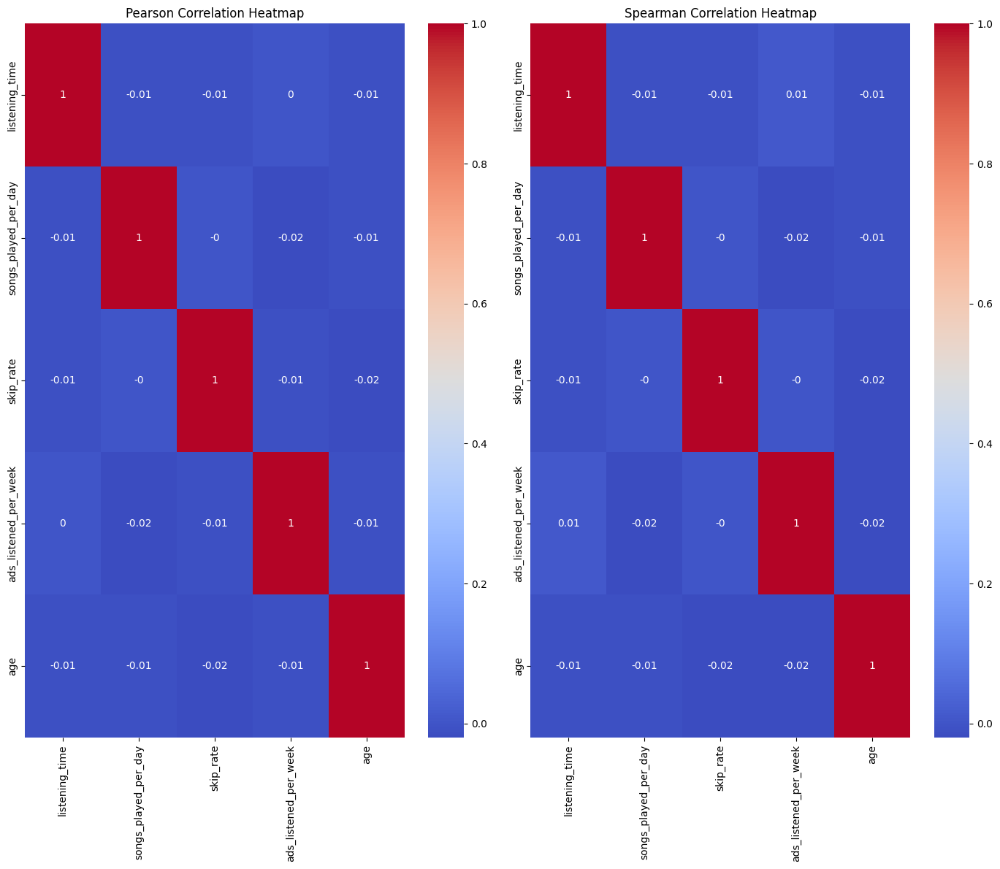

In [32]:
#if you want an heatmap...

fig, axes = plt.subplots(1,2, figsize=(14,12))

sns.heatmap(corr_p, annot=True, cmap="coolwarm", ax=axes[0])
axes[0].set_title("Pearson Correlation Heatmap")

sns.heatmap(corr_r, annot=True, cmap="coolwarm", ax=axes[1])
axes[1].set_title("Spearman Correlation Heatmap")

plt.tight_layout()
plt.show()

### Visualizing Numerical vs. Numerical

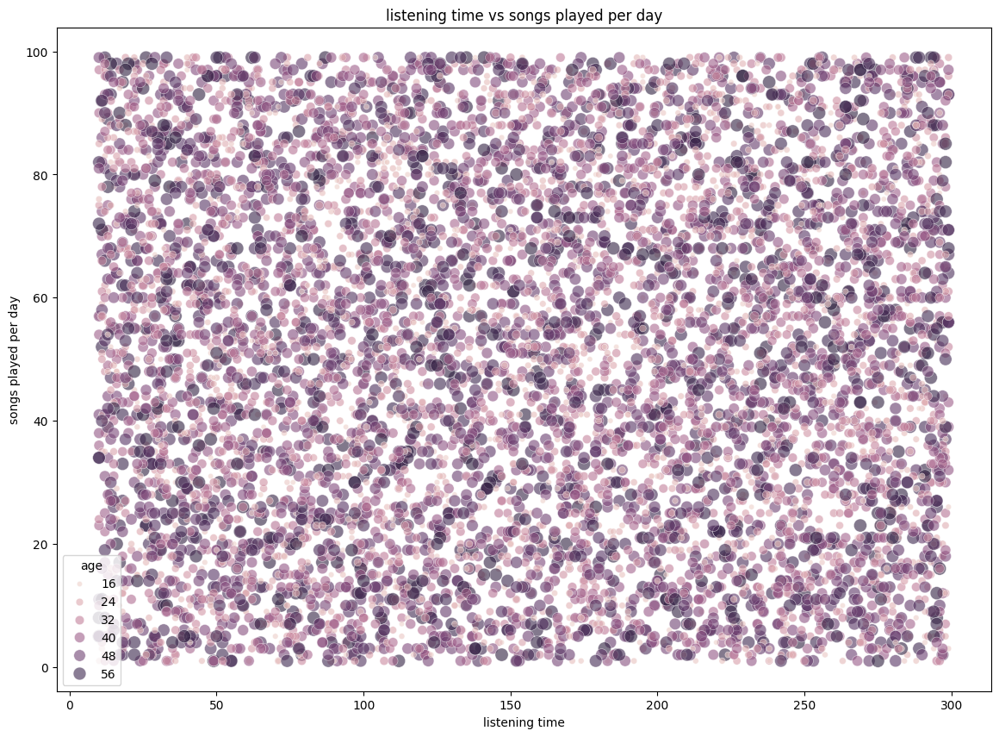

In [7]:
plt.figure(figsize=(14, 10))
sns.scatterplot(x='listening_time', y='songs_played_per_day', data=spoti_data, alpha=0.6, hue="age", size="age" , sizes=(20, 120))
plt.title('listening time vs songs played per day')
plt.xlabel('listening time')
plt.ylabel("songs played per day")
plt.show()

The scatterplot shows that listening_time and songs_played_per_day are widely dispersed with no apparent trend. The Pearson correlation coefficient (-0.01) indicates an almost nonexistent linear relationship, suggesting that the amount of time users spend listening does not necessarily correspond to the number of songs they play per day. This pattern is consistent with independent behavior between the two metrics.

--> same goes for the other features


## Ctegorical vs Numerical: Region vs Income


In [19]:
print("Listening time by region")
print(spoti_data.groupby("country")["listening_time"].agg(["mean", "median","std"]).reset_index().round(2))

print("\nListening time by subscription type")
print(spoti_data.groupby("subscription_type")["listening_time"].agg(["mean", "median","std"]).reset_index().round(2))

Listening time by region
  country    mean  median    std
0      AU  151.93   156.5  83.79
1      CA  152.41   148.5  84.24
2      DE  157.23   161.0  86.03
3      FR  155.32   155.0  84.95
4      IN  154.70   155.0  83.77
5      PK  152.78   150.0  84.95
6      UK  153.15   151.5  82.92
7      US  154.93   156.5  81.60

Listening time by subscription type
  subscription_type    mean  median    std
0            Family  151.04   150.0  83.86
1              Free  155.00   154.0  84.47
2           Premium  155.52   156.0  83.57
3           Student  154.49   156.0  84.17


In [9]:
cat_col = ["subscription_type", "country"]
num_cols = ["listening_time", "songs_played_per_day", "skip_rate", "ads_listened_per_week", "age"]


for cat_col in ["country", "subscription_type", "device_type"]:
  print(f"\nSummary statistics by {cat_col}")
  summary= (
      spoti_data.groupby(cat_col)[num_cols].agg(["mean", "median", "std"]).round(2).reset_index()

  )
  display(summary)


Summary statistics by country


country listening_time               songs_played_per_day                \
                    mean median    std                 mean median    std   
0      AU         151.93  156.5  83.79                49.75   48.0  28.87   
1      CA         152.41  148.5  84.24                52.04   53.0  28.29   
2      DE         157.23  161.0  86.03                48.90   49.0  28.25   
3      FR         155.32  155.0  84.95                50.82   52.0  28.42   
4      IN         154.70  155.0  83.77                49.87   50.0  28.55   
5      PK         152.78  150.0  84.95                51.92   53.0  27.94   
6      UK         153.15  151.5  82.92                49.12   49.0  28.65   
7      US         154.93  156.5  81.60                48.74   50.0  28.49   

  skip_rate              ads_listened_per_week                  age         \
       mean median   std                  mean median    std   mean median   
0      0.30   0.29  0.17                  6.77    0.0  13.52  37.31   37.0   
1      0.31   0.31  0.17                  7.32    0.0  14.10  37.49   37.0   
2      0.31   0.31  0.18                  6.82    0.0  13.70  37.36   38.0   
3      0.30   0.30  0.17                  7.08    0.0  13.86  37.70   38.0   
4      0.30   0.31  0.17                  6.70    0.0  13.19  37.58   38.0   
5      0.30   0.30  0.18                  7.12    0.0  13.63  38.37   40.0   
6      0.30   0.30  0.17                  7.19    0.0  13.80  37.84   38.0   
7      0.29   0.28  0.17                  6.62    0.0  13.20  37.66   38.0   

          
     std  
0  12.64  
1  12.42  
2  12.75  
3  12.73  
4  12.82  
5  12.75  
6  12.86  
7  12.94


Summary statistics by subscription_type


subscription_type listening_time               songs_played_per_day         \
                              mean median    std                 mean median   
0            Family         151.04  150.0  83.86                50.38   50.0   
1              Free         155.00  154.0  84.47                49.20   49.0   
2           Premium         155.52  156.0  83.57                49.74   50.0   
3           Student         154.49  156.0  84.17                51.24   52.0   

         skip_rate              ads_listened_per_week                  age  \
     std      mean median   std                  mean median    std   mean   
0  28.31       0.3   0.30  0.17                  0.00    0.0   0.00  38.08   
1  28.71       0.3   0.30  0.18                 27.53   28.0  12.98  37.29   
2  28.41       0.3   0.29  0.17                  0.00    0.0   0.00  37.57   
3  28.34       0.3   0.30  0.17                  0.00    0.0   0.00  37.74   

                 
  median    std  
0   39.0  12.55  
1   37.0  12.74  
2   37.0  12.81  
3   38.0  12.84


Summary statistics by device_type


device_type listening_time               songs_played_per_day                \
                        mean median    std                 mean median    std   
0     Desktop         156.27  157.0  84.39                50.20   51.0  28.50   
1      Mobile         150.24  150.0  84.51                50.56   50.0  28.49   
2         Web         155.54  155.0  83.01                49.62   49.0  28.37   

  skip_rate              ads_listened_per_week                  age         \
       mean median   std                  mean median    std   mean median   
0       0.3   0.30  0.17                  6.62    0.0  13.40  37.90   38.0   
1       0.3   0.29  0.17                  7.08    0.0  13.69  37.69   38.0   
2       0.3   0.31  0.18                  7.15    0.0  13.77  37.39   37.0   

          
     std  
0  12.86  
1  12.77  
2  12.59

#### **Observations**

We can clearly see that in both comparison the country, subscription and device type don't affect the numerical variables mean, median and standard deviation. The only thing to notice is an higher ads listened per week when using a free spotify subscription and when listening using the web app

### Visualising Categorical vs. Numerical

* **Violin Plots:** Similar to box plots but also show the kernel density estimate (KDE) of the distribution, giving a richer view of the data's shape at different values within each category.


  * A kernel density estimate (KDE) is a smooth curve that shows the estimates the probability density function (PDF), telling us where the values are most concentrated and  hwo they're spread out



**Interpretation:** The width of the violin shows how dense the data are at that value.
- Wide = many observations there.
- Narrow = few observations.

/tmp/ipython-input-2089773711.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=spoti_data, x="country", y="listening_time", ax=axes[0], palette="pastel")
/tmp/ipython-input-2089773711.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=spoti_data, x="country", y="listening_time", ax=axes[1], palette="pastel")


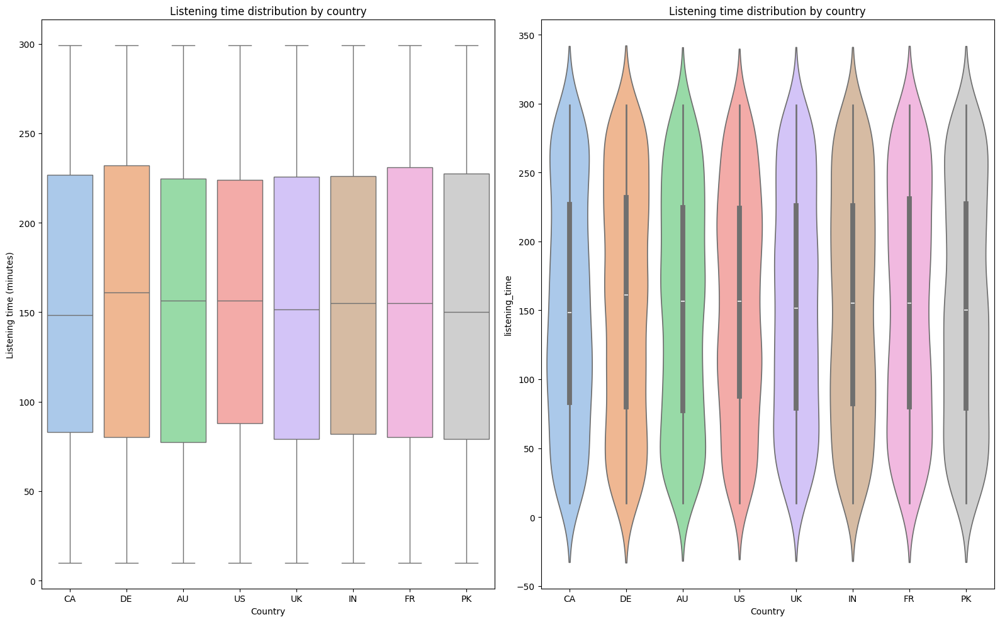

In [5]:
fig, axes = plt.subplots(1,2, figsize=(16,10))

#Listening time
sns.boxplot(data=spoti_data, x="country", y="listening_time", ax=axes[0], palette="pastel")
axes[0].set_title("Listening time distribution by country")
axes[0].set_xlabel("Country")
axes[0].set_ylabel("Listening time (minutes)")

sns.violinplot(data=spoti_data, x="country", y="listening_time", ax=axes[1], palette="pastel")
axes[1].set_title("Listening time distribution by country")
axes[1].set_xlabel("Country")

plt.tight_layout()

plt.show()


#### **Observations**

All countries have a very similar distribution shape: symmetric and smooth, concentrated around the mean
--> different countries have comparable listening patterns

### Categorical vs. Categorical: `Region` vs. `CustomerRating`

Cross-Tabulation (Contingency Tables)
* Counts the occurrences of each combination of categories.
* Can also show proportions (row-wise, column-wise, or total).

**Interpretation:** Helps identify if certain categories from one variable are disproportionately associated with categories from another

In [22]:
print("Cross-tabulation : Country vs Subscription type (counts)")
cross_tab_counts1 = pd.crosstab(spoti_data["country"], spoti_data["subscription_type"])
display(cross_tab_counts1)

print("\nCross-tabulation : Country vs Subscription type (Row-wise Persentages)")
cross_tab_percent1 = pd.crosstab(spoti_data["country"], spoti_data["subscription_type"], normalize="index").mul(100).round(3)
display(cross_tab_percent1)

print("Cross-tabulation : Subscription type vs Device type (counts)")
cross_tab_counts2 = pd.crosstab(spoti_data["subscription_type"], spoti_data["device_type"])
display(cross_tab_counts2)

print("\nCross-tabulation : Subscription vs Device type (Row-wise Persentages)")
cross_tab_percent2 = pd.crosstab(spoti_data["subscription_type"], spoti_data["device_type"], normalize="index").mul(100).round(3)
display(cross_tab_percent2)

print("Cross-tabulation : Country vs Device type (counts)")
cross_tab_counts3 = pd.crosstab(spoti_data["country"], spoti_data["device_type"])
display(cross_tab_counts3)

print("\nCross-tabulation : Country vs Device type (Row-wise Persentages)")
cross_tab_percent3 = pd.crosstab(spoti_data["country"], spoti_data["device_type"], normalize="index").mul(100).round(3)
display(cross_tab_percent3)


Cross-tabulation : Country vs Subscription type (counts)


subscription_type,Family,Free,Premium,Student
country,,,,
AU,263,247,269,255
CA,235,246,234,239
DE,257,249,252,257
FR,231,252,274,232
IN,220,255,285,251
PK,252,265,235,247
UK,207,249,282,228
US,243,255,284,250



Cross-tabulation : Country vs Subscription type (Row-wise Persentages)


subscription_type,Family,Free,Premium,Student
country,,,,
AU,25.435,23.888,26.015,24.662
CA,24.633,25.786,24.528,25.052
DE,25.320,24.532,24.828,25.320
FR,23.357,25.480,27.705,23.458
IN,21.761,25.223,28.190,24.827
PK,25.225,26.527,23.524,24.725
UK,21.429,25.776,29.193,23.602
US,23.547,24.709,27.519,24.225


Cross-tabulation : Subscription type vs Device type (counts)


device_type,Desktop,Mobile,Web
subscription_type,,,
Family,665,626,617
Free,663,670,685
Premium,745,678,692
Student,705,625,629



Cross-tabulation : Subscription vs Device type (Row-wise Persentages)


device_type,Desktop,Mobile,Web
subscription_type,,,
Family,34.853,32.809,32.338
Free,32.854,33.201,33.944
Premium,35.225,32.057,32.719
Student,35.988,31.904,32.108


Cross-tabulation : Country vs Device type (counts)


device_type,Desktop,Mobile,Web
country,,,
AU,371,325,338
CA,339,311,304
DE,356,321,338
FR,336,308,345
IN,376,332,303
PK,307,368,324
UK,338,317,311
US,355,317,360



Cross-tabulation : Country vs Device type (Row-wise Persentages)


device_type,Desktop,Mobile,Web
country,,,
AU,35.880,31.431,32.689
CA,35.535,32.600,31.866
DE,35.074,31.626,33.300
FR,33.974,31.143,34.884
IN,37.191,32.839,29.970
PK,30.731,36.837,32.432
UK,34.990,32.816,32.195
US,34.399,30.717,34.884


#### **Observations**

- Family : DE(Desktop)
- Free : PK(Web)
- Premium: UK (Desktop)
- Student: DE (Desktop)

Other than that, Desktop app is more used in India, Mobile app in Pakistan and Web app in France

### Visualising Categorical vs. Categorical
* **Stacked/Grouped Bar Charts:** Visually compare the distributions.
* **Heatmaps:** Excellent for cross-tabulations, especially when there are many categories, making it easy to spot patterns from color intensity.

**Interpretation:** Heatmaps quickly reveal which combinations of categories are most or least frequent.

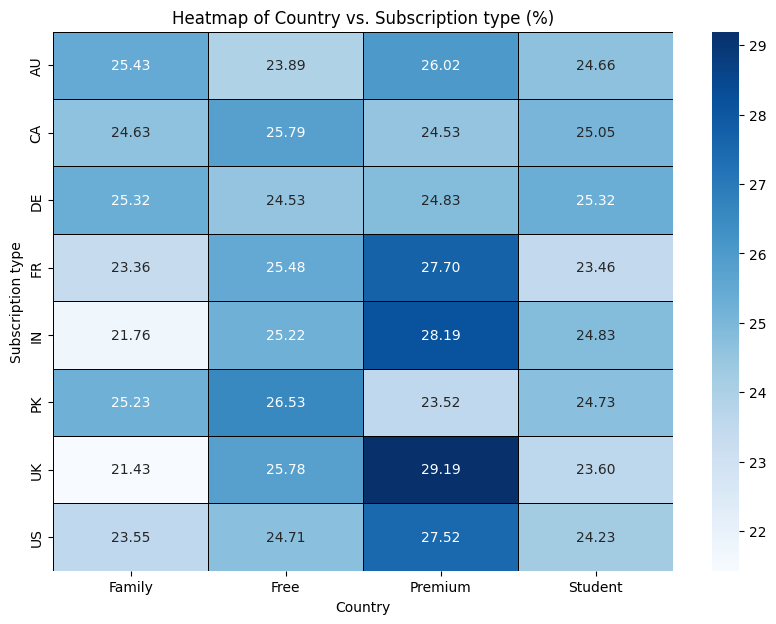

In [27]:
plt.figure(figsize=(10,7))
sns.heatmap(cross_tab_percent1, annot=True, fmt=".2f", cmap="Blues", linewidths=.5, linecolor="black")
plt.title('Heatmap of Country vs. Subscription type (%)')
plt.xlabel('Country')
plt.ylabel('Subscription type')
plt.show()

## Multivariate Analysis

A seaborn.pairplot creates a grid of plots: histograms for each variable on the diagonal and scatter plots for all pairwise combinations of numerical variables off the diagonal. It's a quick way to get an overview of multiple relationships.

**Interpretation**: A single pair plot can quickly reveal distributions, correlations, and potential clusters or outliers across many variables at once. Adding hue allows us to see how a categorical variable influences these pairwise relationships.


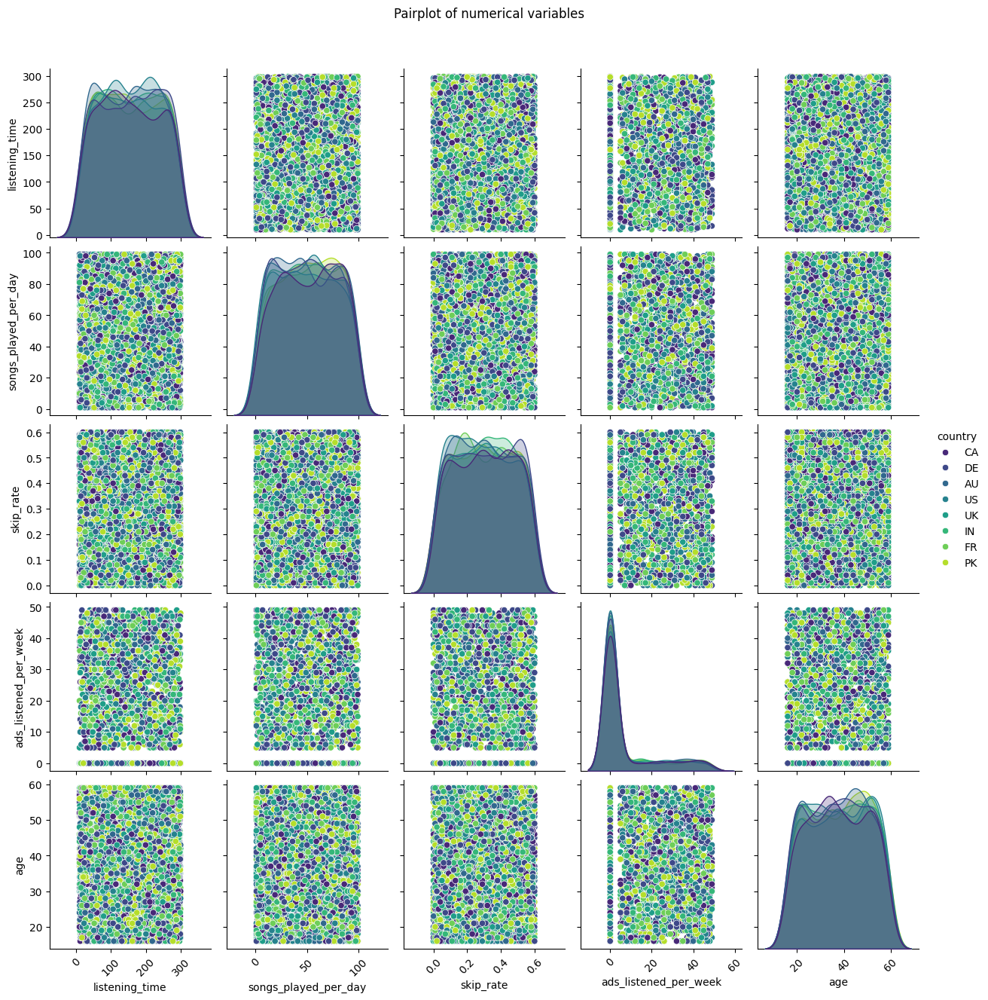

In [11]:
df = spoti_data[num_cols + ["country"]]

g = sns.pairplot(df ,hue="country", palette = "viridis", diag_kind="kde")
plt.suptitle("Pairplot of numerical variables", y=1.05)

#rotate axis label for better readability
for ax in g.axes.flat:
  ax.tick_params(axis ="x", rotation = 45)

plt.show()

Scatterplots look like random clouds →  matches the correlations being near zero between the numerical variables (no strong relationships).
The diagonal plots for numerical variables show smooth, fairly uniform shapes — not much difference among countries → distributions look consistent.
The ads_listened_per_week plot shows one sharp peak near 0 → most users rarely hear ads (Total of Premium, Student and Family users dominate over the Free users).

### Conditional Plots
(Facet Grids)`seaborn`'s `FacetGrid` (or direct use of `col`/`row` parameters in many `seaborn` plots) allows splitting a plot into multiple subplots based on the values of one or more categorical variables.

**Interpretation:** This helps identify if relationships or distributions change significantly depending on the category.

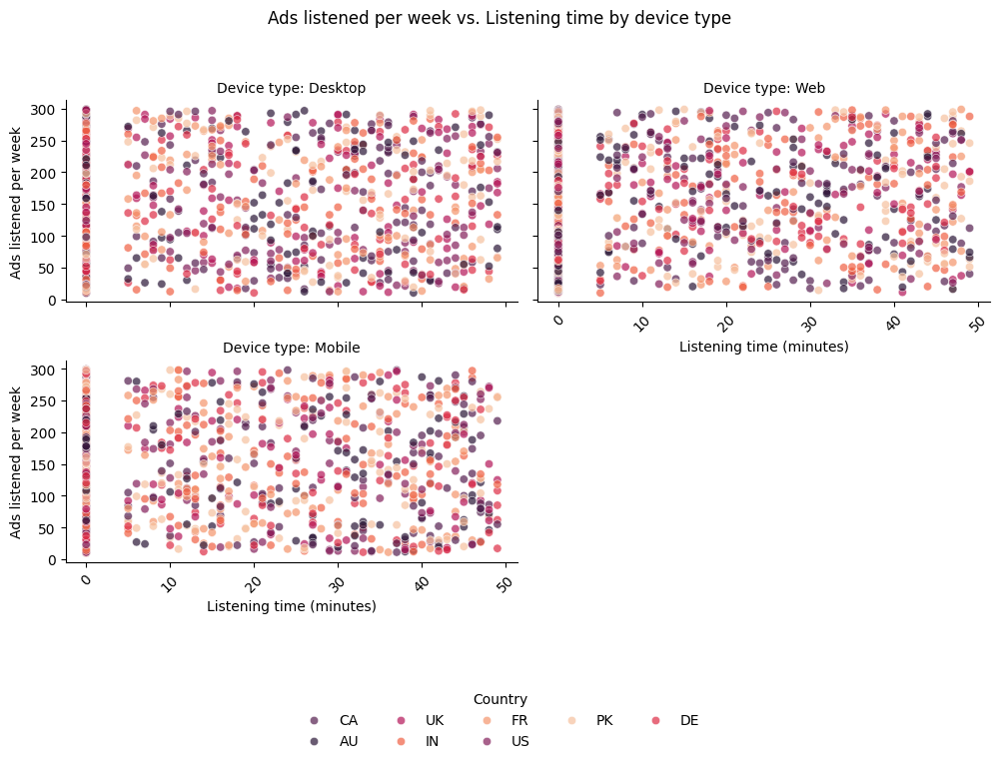

In [34]:
g = sns.FacetGrid(spoti_data, col="device_type", col_wrap=2, height=3, aspect=1)
g.map_dataframe(sns.scatterplot, x="ads_listened_per_week", y="listening_time",hue="country" ,palette="rocket", alpha=0.7)
g.add_legend(title='Country',
             bbox_to_anchor=(0.5, -0.10),
             loc='upper center',
             ncol=5, frameon=False)
g.set_axis_labels("Listening time (minutes)", "Ads listened per week")
g.set_titles(col_template="Device type: {col_name}")
plt.suptitle("Ads listened per week vs. Listening time by device type", y=1.02)

plt.tight_layout(rect=[0,0,1,0.98])

for ax in g.axes.flat:
  ax.tick_params(axis="x", rotation = 45)

plt.show()


## 5. Outlier Detection
We saw outliers in box plots. Let's quantify them using the IQR method and understand their implications.

#### IQR Method for Outlier DetectionThis method defines outliers as values falling outside specific 'fences':
* **Lower Fence:** Q1 - 1.5 * IQR
* **Upper Fence:** Q3 + 1.5 * IQR

**Interpretation:** This provides a statistical definition of 'extreme' values. Outliers can represent data entry errors, rare but valid events, or significant anomalies. Their presence can heavily influence means, standard deviations, and many machine learning models, so identifying them is crucial.

In [37]:
def find_iqr_outliers(series):
  Q1 = series.quantile(0.25)
  Q3 = series.quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = series[(series < lower_bound) | (series > upper_bound)]
  return outliers, lower_bound, upper_bound

for n in num_cols:
  outliers, lower_bound, upper_bound = find_iqr_outliers(spoti_data[n])

  if outliers.empty:
    print(f"No outliers found for {n}")
  else:
    print(f"\nOutliers, lower bound and upper bound for {n}:")
    display(outliers, lower_bound, upper_bound)

No outliers found for listening_time
No outliers found for songs_played_per_day
No outliers found for skip_rate

Outliers, lower bound and upper bound for ads_listened_per_week:


,ads_listened_per_week
0,31
5,13
9,44
10,37
11,39
...,...
7969,46
7979,44
7989,29
7992,49


np.float64(-7.5)

np.float64(12.5)

No outliers found for age


## 6. Missing Value Analysis
We saw `df.info()` showing no missing values. So we are gonna create them randomly to learn how to visualise their patterns

#### Visualising Missingness
A heatmap can show the distribution of missing values across the dataset. This is important because the *pattern* of missingness can tell you a lot.

* **Missing Completely at Random (MCAR):** No identifiable pattern.
* **Missing at Random (MAR):** Missingness depends on other observed variables.
* **Missing Not at Random (MNAR):** Missingness depends on the unobserved value itself.

**Interpretation:** Understanding the pattern guides imputation strategies. For MCAR/MAR, simple imputation methods (mean/median/mode) or more sophisticated techniques might be appropriate. For MNAR, imputation is much harder, and the missingness itself might be a valuable signal.

In [43]:
#Creating random outliers
spoti_data.loc[spoti_data.sample(frac=0.03).index, "listening_time"]= np.nan
spoti_data.loc[spoti_data.sample(frac=0.01).index, "skip_rate"]= np.nan
spoti_data.loc[spoti_data.sample(frac=0.01).index, "ads_listened_per_week"]= np.nan
#it randomly select fraction of the rows(frac) and uses .loc[] to select those same rows and the column specified
#of those selected it assigns a NaN value

In [44]:
spoti_data.isnull().sum()

,0
user_id,0
age,0
country,0
subscription_type,0
listening_time,469
songs_played_per_day,0
skip_rate,160
device_type,0
ads_listened_per_week,80
offline_listening,0


In [47]:
from google.colab import data_table

data_table.enable_dataframe_formatter()
spoti_data[spoti_data.isna().any(axis=1)]

,user_id,age,country,subscription_type,listening_time,songs_played_per_day,skip_rate,device_type,ads_listened_per_week,offline_listening,is_churned
9,10,44,DE,Free,278.0,94,NaN,Mobile,44.0,0,0
11,12,24,CA,Free,NaN,24,0.56,Desktop,39.0,0,1
17,18,58,US,Family,120.0,8,NaN,Desktop,0.0,1,0
31,32,53,US,Student,NaN,12,0.17,Web,0.0,1,0
47,48,58,US,Family,NaN,23,0.08,Mobile,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
7953,7954,49,PK,Family,NaN,37,0.43,Mobile,0.0,1,0
7955,7956,21,DE,Student,NaN,46,0.49,Web,0.0,1,0
7960,7961,45,AU,Student,NaN,95,0.41,Web,0.0,1,0
7990,7991,50,DE,Premium,NaN,21,0.04,Desktop,0.0,1,0


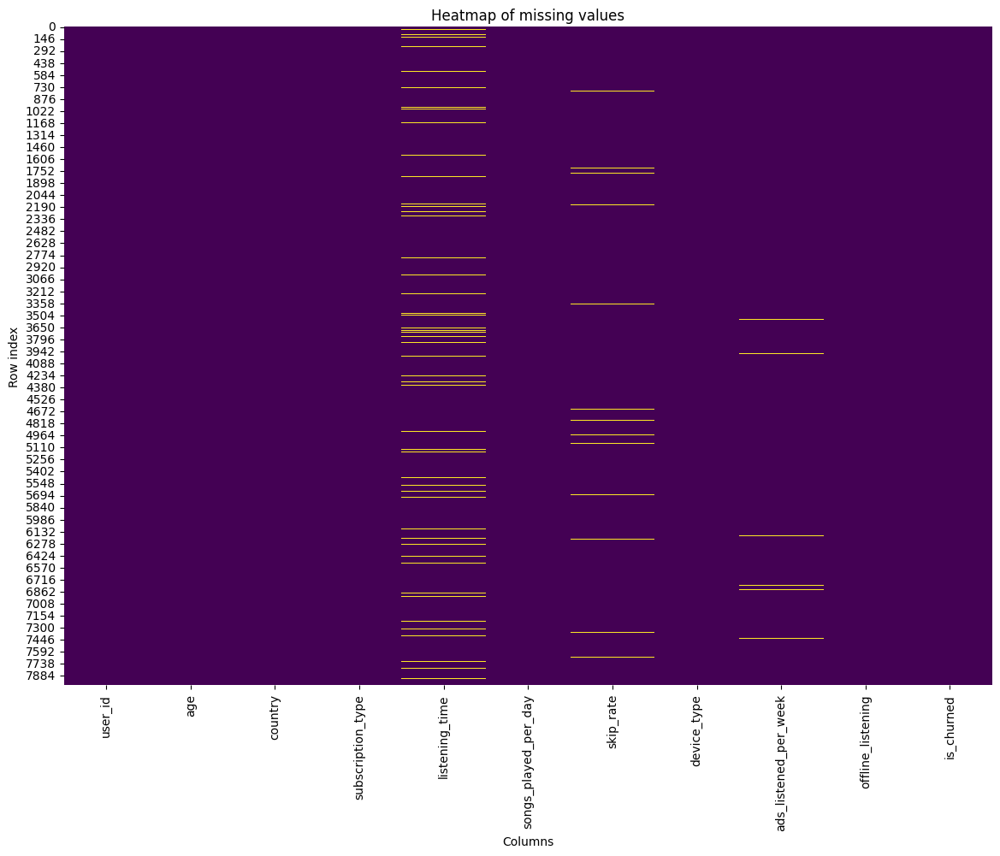

--- Percentage of Missing Values ---
user_id                  0.0000
age                      0.0000
country                  0.0000
subscription_type        0.0000
listening_time           5.8625
songs_played_per_day     0.0000
skip_rate                2.0000
device_type              0.0000
ads_listened_per_week    1.0000
offline_listening        0.0000
is_churned               0.0000
dtype: float64


In [49]:
plt.figure(figsize=(14,10))
sns.heatmap(spoti_data.isnull(), cbar=False, cmap="viridis")
plt.title("Heatmap of missing values")
plt.ylabel("Row index")
plt.xlabel("Columns")
plt.show()

print("--- Percentage of Missing Values ---")
print(spoti_data.isnull().sum()/len(spoti_data)*100)

There are obviously missing values in listening_time, skip_rate and ads_listened_er_week. Of course these NaN are randomly scattered, there is no block of missin values in rows or columns.